# Лабораторная 2. Очистка набора данных

Отбор признаков - важная задача перед обучением модели машинного обучения. Признаки отбираются чаще всего вручную на основании описательной статистики, тепловой карты, показывающей линейную корреляцию и важности признаков. Никогда не смотрят только на что-то одно, всегда признаки рассматривают с разных сторон.

# Подключение модулей

Для определения важности признаков можно использовать вектор feature_importance, которые строится с помощью Random Forest. При этом для задач регрессии необходимо подключать именно RandomForestRegressor, для задач классификации - RandomForestClassifier

In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np

# Загрузка данных

В данной задаче у нас 28 признаков и 2 целевые переменные (G_total и КГФ). И это вносит дополнительную сложность, так как первая целевая переменная с большим количество пропусков.

In [5]:
df = pd.read_csv('agaricus-lepiota.data', header=None)

In [6]:
df

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
0,p,x,s,n,t,p,f,c,n,k,...,s,w,w,p,w,o,p,k,s,u
1,e,x,s,y,t,a,f,c,b,k,...,s,w,w,p,w,o,p,n,n,g
2,e,b,s,w,t,l,f,c,b,n,...,s,w,w,p,w,o,p,n,n,m
3,p,x,y,w,t,p,f,c,n,n,...,s,w,w,p,w,o,p,k,s,u
4,e,x,s,g,f,n,f,w,b,k,...,s,w,w,p,w,o,e,n,a,g
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8119,e,k,s,n,f,n,a,c,b,y,...,s,o,o,p,o,o,p,b,c,l
8120,e,x,s,n,f,n,a,c,b,y,...,s,o,o,p,n,o,p,b,v,l
8121,e,f,s,n,f,n,a,c,b,n,...,s,o,o,p,o,o,p,b,c,l
8122,p,k,y,n,f,y,f,c,n,b,...,k,w,w,p,w,o,e,w,v,l


# Описательная статистика

Описательная статистика для непрерывных и категориальных признаках отличается.

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8124 entries, 0 to 8123
Data columns (total 23 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   0       8124 non-null   object
 1   1       8124 non-null   object
 2   2       8124 non-null   object
 3   3       8124 non-null   object
 4   4       8124 non-null   object
 5   5       8124 non-null   object
 6   6       8124 non-null   object
 7   7       8124 non-null   object
 8   8       8124 non-null   object
 9   9       8124 non-null   object
 10  10      8124 non-null   object
 11  11      8124 non-null   object
 12  12      8124 non-null   object
 13  13      8124 non-null   object
 14  14      8124 non-null   object
 15  15      8124 non-null   object
 16  16      8124 non-null   object
 17  17      8124 non-null   object
 18  18      8124 non-null   object
 19  19      8124 non-null   object
 20  20      8124 non-null   object
 21  21      8124 non-null   object
 22  22      8124 non-null   

In [8]:
df.describe()

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
count,8124,8124,8124,8124,8124,8124,8124,8124,8124,8124,...,8124,8124,8124,8124,8124,8124,8124,8124,8124,8124
unique,2,6,4,10,2,9,2,2,2,12,...,4,9,9,1,4,3,5,9,6,7
top,e,x,y,n,f,n,f,c,b,b,...,s,w,w,p,w,o,p,w,v,d
freq,4208,3656,3244,2284,4748,3528,7914,6812,5612,1728,...,4936,4464,4384,8124,7924,7488,3968,2388,4040,3148


Присвоим числа значниям признаков.

In [14]:
def assign_numbers(df):
    mapping = {}
    for col in df.columns:
        unique_letters = df[col].unique()
        num_letters = len(unique_letters)
        mapping[col] = {letter: num + 1 for num, letter in enumerate(unique_letters)}
    return df.replace(mapping)

df = assign_numbers(df)
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,2.0,1.0,1.0,2.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0
2,2.0,2.0,1.0,3.0,1.0,3.0,1.0,1.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,3.0
3,1.0,1.0,2.0,3.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,2.0,1.0,1.0,4.0,2.0,4.0,1.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,3.0,2.0
5,2.0,1.0,2.0,2.0,1.0,2.0,1.0,1.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0
6,2.0,2.0,1.0,3.0,1.0,2.0,1.0,1.0,2.0,3.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,3.0
7,2.0,2.0,2.0,3.0,1.0,3.0,1.0,1.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,3.0
8,1.0,1.0,2.0,3.0,1.0,1.0,1.0,1.0,1.0,4.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,4.0,2.0
9,2.0,2.0,1.0,2.0,1.0,2.0,1.0,1.0,2.0,3.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0


Стандартные функции pandas не выводят всю необходимую описательную статистику, поэтому создадим свою таблицу с описательной статистикой. Для удобства закрасим признаки с единичной мощностью и большим количеством пропусков, чтобы потом их было легче удалить.

In [15]:
# def PrintStats(f):
C = len(df.columns)
L = len(df.index)
CN = df.count() #количество
NP = ((L - CN) / L) * 100 #процент пропущенных значений
MN = df.min(numeric_only=True) #минимум
Q1 = df.quantile(q=0.25, numeric_only=True) #первый квартиль
MA = df.mean(numeric_only=True) #среднее значение
ME = df.median(numeric_only=True) #медиана
Q3 = df.quantile(q=0.75, numeric_only=True) #третий квартиль
MX = df.max(numeric_only=True) #максимум
ST = df.std(numeric_only=True) #стандартное отклонение
P = df.nunique() #мощность
IQ = Q3 - Q1 #интерквартильный размах

frame = pd.concat([CN, NP, MN, Q1, MA, ME, Q3, MX, ST, P, IQ], axis=1, join="inner")
frame = frame.T
f = pd.DataFrame(frame)
f.index=['Количество', 'Процент пропусков', 'Минимум', 'Первый квартиль','Среднее', 'Медиана', 'Третий квартиль', 'Максимум','Стандартное отклонение', 'Мощность', 'Интерквартильный размах']
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
f1 = f.style.apply(lambda x: ["background-color:tomato" if i==1 else "" for i in x], axis=1, subset=(["Мощность"], slice(None))).apply(lambda x: ["background-color:tomato" if i>=60 else "" for i in x], axis=1, subset=(["Процент пропусков"], slice(None))).apply(lambda x: ["background-color:steelblue" if (i<30 and i>0) else "" for i in x], axis=1, subset=(["Процент пропусков"], slice(None))).apply(lambda x: ["background-color:limegreen" if i==0 else "" for i in x], axis=1, subset=(["Процент пропусков"], slice(None)))
display(f1)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22
Количество,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000
Процент пропусков,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Минимум,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Первый квартиль,1.000000,1.000000,1.000000,1.000000,1.000000,4.000000,1.000000,1.000000,1.000000,3.000000,1.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,3.000000,2.000000
Среднее,1.517971,2.637617,1.971935,3.093550,1.584441,4.589365,1.025849,1.161497,1.690793,5.274249,1.567208,3.290005,1.660758,1.994584,2.149680,2.061546,1.000000,1.038405,1.082718,1.696209,3.200886,3.687839,3.794682
Медиана,2.000000,2.000000,2.000000,3.000000,2.000000,4.000000,1.000000,1.000000,2.000000,5.000000,2.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,4.000000,4.000000,4.000000
Третий квартиль,2.000000,4.000000,3.000000,4.000000,2.000000,5.000000,1.000000,1.000000,2.000000,7.000000,2.000000,5.000000,3.000000,4.000000,3.000000,2.000000,1.000000,1.000000,1.000000,2.000000,5.000000,5.000000,5.000000
Максимум,2.000000,6.000000,4.000000,10.000000,2.000000,9.000000,2.000000,2.000000,2.000000,12.000000,2.000000,5.000000,4.000000,4.000000,9.000000,9.000000,1.000000,4.000000,3.000000,5.000000,9.000000,6.000000,7.000000
Стандартное отклонение,0.499708,1.588969,0.775534,1.744794,0.492848,1.557709,0.158695,0.368011,0.462195,2.669652,0.495493,1.334434,0.908808,1.333097,1.563541,1.648595,0.000000,0.257837,0.291116,0.786930,1.742226,1.381200,1.617549
Мощность,2.000000,6.000000,4.000000,10.000000,2.000000,9.000000,2.000000,2.000000,2.000000,12.000000,2.000000,5.000000,4.000000,4.000000,9.000000,9.000000,1.000000,4.000000,3.000000,5.000000,9.000000,6.000000,7.000000


Удалим признаки, у которых мощность равна 1 и пропусков слишком много

In [21]:
df = df.drop(df.columns[16], axis=1)

Нормализуем значения признаков.

In [22]:
df = (df - df.min()) / (df.max() - df.min())
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,17,18,19,20,21,22
0,0.0,0.0,0.000000,0.000000,0.0,0.000,0.0,0.0,0.0,0.000000,0.0,0.00,0.000000,0.000000,0.000,0.000,0.000000,0.0,0.00,0.000,0.0,0.000000
1,1.0,0.0,0.000000,0.111111,0.0,0.125,0.0,0.0,1.0,0.000000,0.0,0.25,0.000000,0.000000,0.000,0.000,0.000000,0.0,0.00,0.125,0.2,0.166667
2,1.0,0.2,0.000000,0.222222,0.0,0.250,0.0,0.0,1.0,0.090909,0.0,0.25,0.000000,0.000000,0.000,0.000,0.000000,0.0,0.00,0.125,0.2,0.333333
3,0.0,0.0,0.333333,0.222222,0.0,0.000,0.0,0.0,0.0,0.090909,0.0,0.00,0.000000,0.000000,0.000,0.000,0.000000,0.0,0.00,0.000,0.0,0.000000
4,1.0,0.0,0.000000,0.333333,1.0,0.375,0.0,1.0,1.0,0.000000,1.0,0.00,0.000000,0.000000,0.000,0.000,0.000000,0.0,0.25,0.125,0.4,0.166667
5,1.0,0.0,0.333333,0.111111,0.0,0.125,0.0,0.0,1.0,0.090909,0.0,0.25,0.000000,0.000000,0.000,0.000,0.000000,0.0,0.00,0.000,0.2,0.166667
6,1.0,0.2,0.000000,0.222222,0.0,0.125,0.0,0.0,1.0,0.181818,0.0,0.25,0.000000,0.000000,0.000,0.000,0.000000,0.0,0.00,0.000,0.2,0.333333
7,1.0,0.2,0.333333,0.222222,0.0,0.250,0.0,0.0,1.0,0.090909,0.0,0.25,0.000000,0.000000,0.000,0.000,0.000000,0.0,0.00,0.125,0.0,0.333333
8,0.0,0.0,0.333333,0.222222,0.0,0.000,0.0,0.0,0.0,0.272727,0.0,0.00,0.000000,0.000000,0.000,0.000,0.000000,0.0,0.00,0.000,0.6,0.166667
9,1.0,0.2,0.000000,0.111111,0.0,0.125,0.0,0.0,1.0,0.181818,0.0,0.25,0.000000,0.000000,0.000,0.000,0.000000,0.0,0.00,0.000,0.0,0.333333


Восстановим значения признаков с количеством пропусков, не превышающим 15%, средним значением

In [23]:
C = len(df.columns)
L = len(df.index)
CN = df.count() #количество
NP = ((L - CN) / L) * 100 #процент пропущенных значений
MN = df.min(numeric_only=True) #минимум
Q1 = df.quantile(q=0.25, numeric_only=True) #первый квартиль
MA = df.mean(numeric_only=True) #среднее значение
ME = df.median(numeric_only=True) #медиана
Q3 = df.quantile(q=0.75, numeric_only=True) #третий квартиль
MX = df.max(numeric_only=True) #максимум
ST = df.std(numeric_only=True) #стандартное отклонение
P = df.nunique() #мощность
IQ = Q3 - Q1 #интерквартильный размах

frame = pd.concat([CN, NP, MN, Q1, MA, ME, Q3, MX, ST, P, IQ], axis=1, join="inner")
frame = frame.T
f = pd.DataFrame(frame)
f.index=['Количество', 'Процент пропусков', 'Минимум', 'Первый квартиль','Среднее', 'Медиана', 'Третий квартиль', 'Максимум','Стандартное отклонение', 'Мощность', 'Интерквартильный размах']
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
f1 = f.style.apply(lambda x: ["background-color:tomato" if i==1 else "" for i in x], axis=1, subset=(["Мощность"], slice(None))).apply(lambda x: ["background-color:tomato" if i>=60 else "" for i in x], axis=1, subset=(["Процент пропусков"], slice(None))).apply(lambda x: ["background-color:steelblue" if (i<30 and i>0) else "" for i in x], axis=1, subset=(["Процент пропусков"], slice(None))).apply(lambda x: ["background-color:limegreen" if i==0 else "" for i in x], axis=1, subset=(["Процент пропусков"], slice(None)))
display(f1)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,17,18,19,20,21,22
Количество,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000
Процент пропусков,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Минимум,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Первый квартиль,0.000000,0.000000,0.000000,0.000000,0.000000,0.375000,0.000000,0.000000,0.000000,0.181818,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.125000,0.400000,0.166667
Среднее,0.517971,0.327523,0.323978,0.232617,0.584441,0.448671,0.025849,0.161497,0.690793,0.388568,0.567208,0.572501,0.220253,0.331528,0.143710,0.132693,0.012802,0.041359,0.174052,0.275111,0.537568,0.465780
Медиана,1.000000,0.200000,0.333333,0.222222,1.000000,0.375000,0.000000,0.000000,1.000000,0.363636,1.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.250000,0.375000,0.600000,0.500000
Третий квартиль,1.000000,0.600000,0.666667,0.333333,1.000000,0.500000,0.000000,0.000000,1.000000,0.545455,1.000000,1.000000,0.666667,1.000000,0.250000,0.125000,0.000000,0.000000,0.250000,0.500000,0.800000,0.666667
Максимум,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Стандартное отклонение,0.499708,0.317794,0.258511,0.193866,0.492848,0.194714,0.158695,0.368011,0.462195,0.242696,0.495493,0.333609,0.302936,0.444366,0.195443,0.206074,0.085946,0.145558,0.196733,0.217778,0.276240,0.269591
Мощность,2.000000,6.000000,4.000000,10.000000,2.000000,9.000000,2.000000,2.000000,2.000000,12.000000,2.000000,5.000000,4.000000,4.000000,9.000000,9.000000,4.000000,3.000000,5.000000,9.000000,6.000000,7.000000


# Распределения

Построим графики распределения значений признаков. Дополнительно покажем линиями первый и третий квартили, медиану и среднее. Также выведем пороги отсечения выбросов по интерквартильному размаху.
Единственный выброс, который здесь можно гарантированно увидеть, это слева у признака "Ro_c"

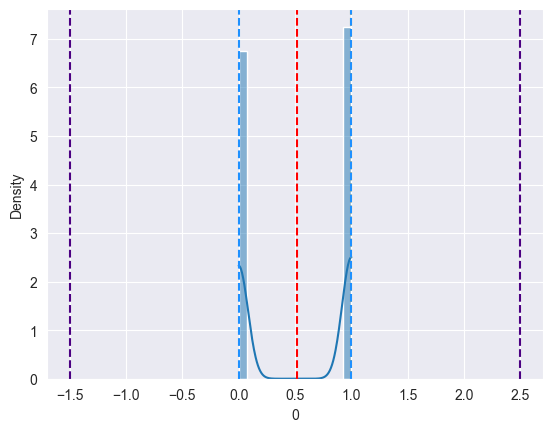

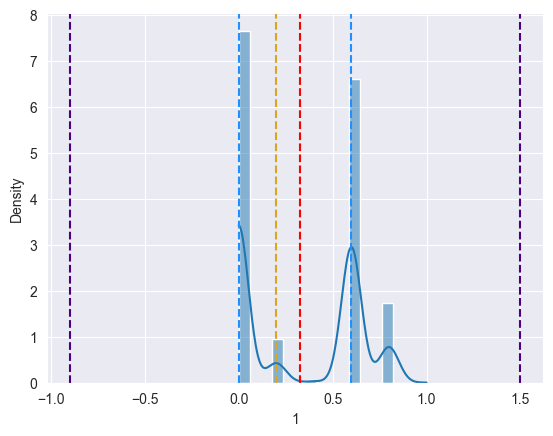

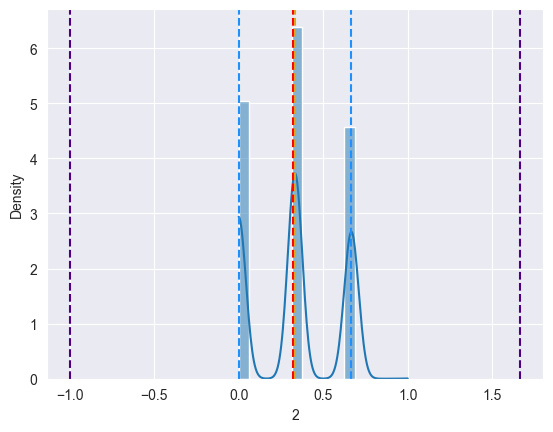

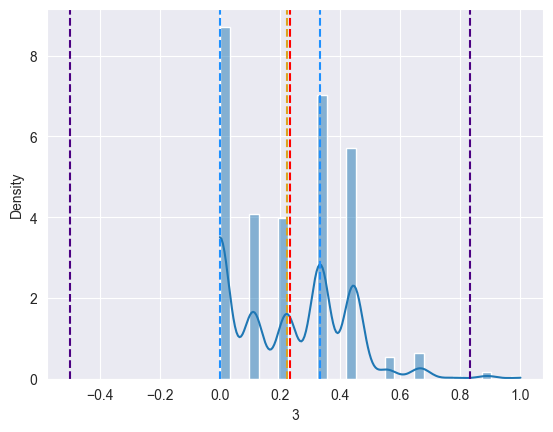

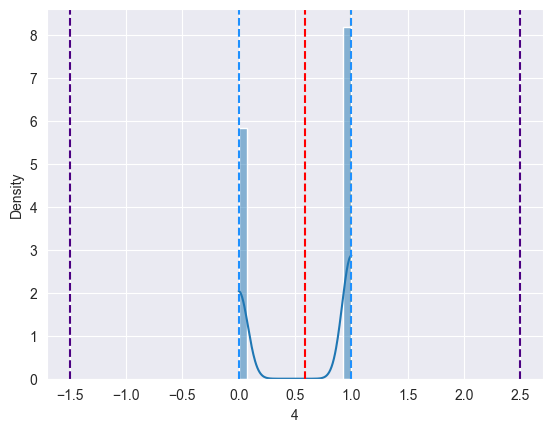

...

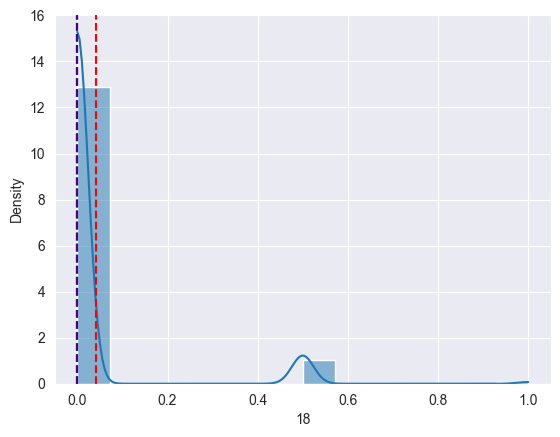

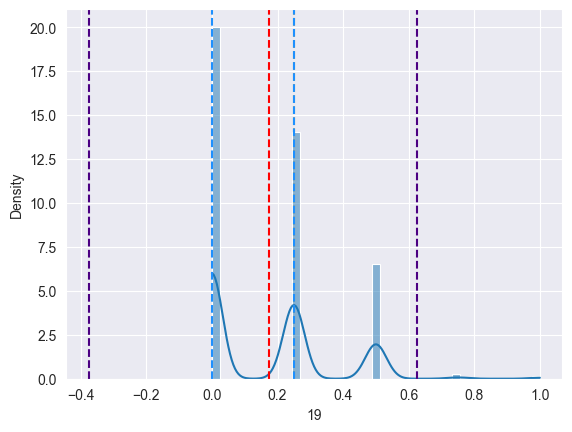

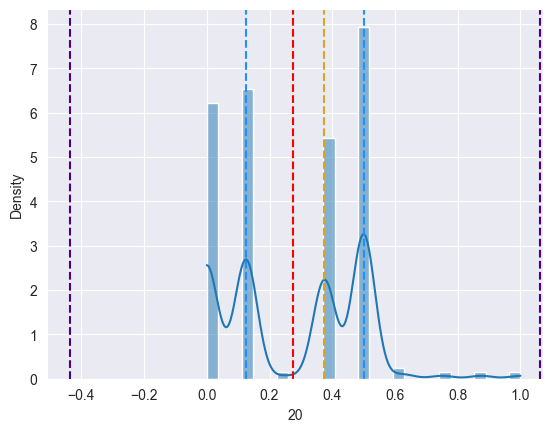

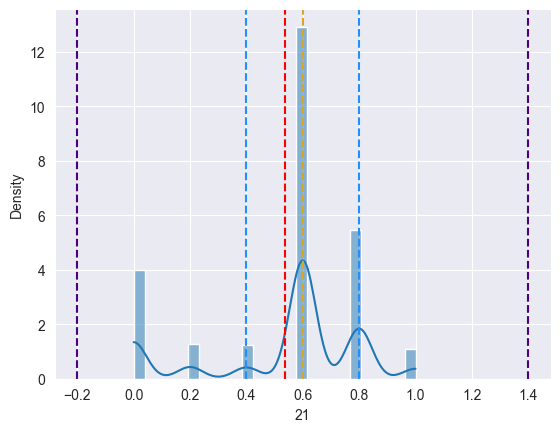

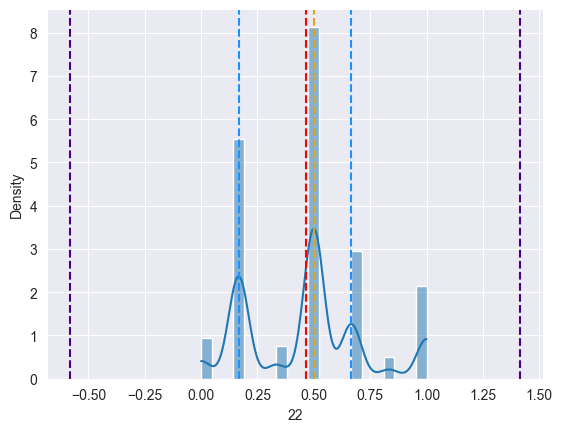

In [26]:
for i in df.columns:
    plt.figure(i)
    sns.histplot(df[i],kde=True,stat="density")
    plt.axvline(f.iloc[3][i]-1.5*f.iloc[10][i], color="indigo", ls='--') #q1-1.5*iqr
    plt.axvline(f.iloc[3][i], color="dodgerblue", ls='--') #первый квартиль
    plt.axvline(f.iloc[4][i], color="red", ls='--') #среднее
    plt.axvline(f.iloc[5][i], color="goldenrod", ls='--') #медиана
    plt.axvline(f.iloc[6][i], color="dodgerblue", ls='--') #третий квартиль
    plt.axvline(f.iloc[6][i]+1.5*f.iloc[10][i], color="indigo", ls='--') #q3+1.5*iqr
    plt.show()

# Тепловая карта

<Axes: >

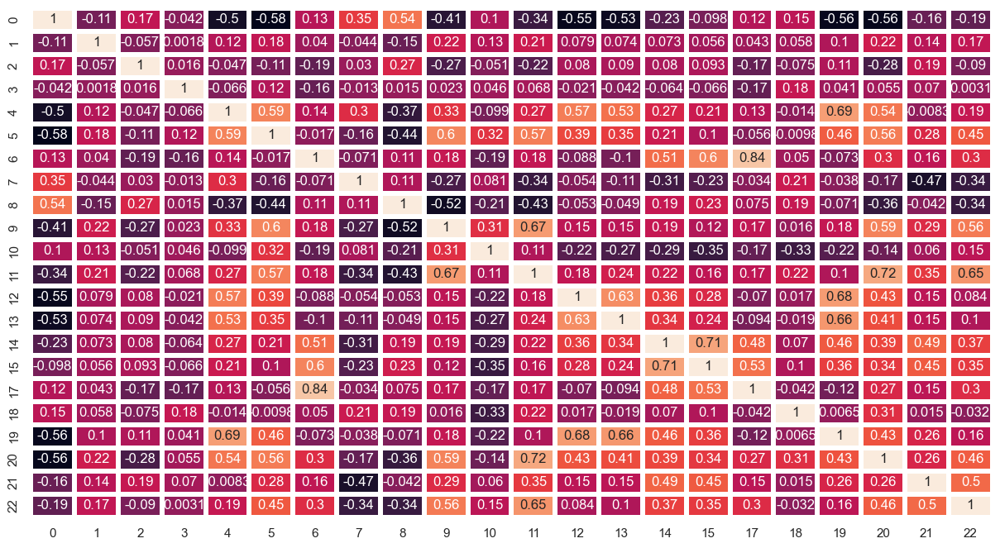

In [28]:
sns.set(rc = {'figure.figsize':(15,8)})
sns.heatmap(df.corr(), annot=True, linewidths=3, cbar=False)

In [32]:
df.to_csv('mushrooms_dataset.csv', index=False)

In [35]:
training_dataset_size = round(len(df.index) * 0.7)
df1 = df.iloc[:training_dataset_size,:]
df2 = df.iloc[training_dataset_size:,:]
df1.to_csv('training_mushrooms_dataset.csv', index=False)
df2.to_csv('testing_mushrooms_dataset.csv', index=False)